In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots


In [3]:
# Load the dataset
df = pd.read_csv('/Users/user/Downloads/TrafficNG/traffic_weather_data_lagos.csv')

# Display basic information
print(df.info())
print(df.describe())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16238 entries, 0 to 16237
Data columns (total 30 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   city                      16238 non-null  object 
 1   origin                    16238 non-null  object 
 2   destination               16238 non-null  object 
 3   distance_km               16238 non-null  object 
 4   distance_meters           16238 non-null  int64  
 5   duration_normal_mins      16238 non-null  int64  
 6   duration_in_traffic_mins  16238 non-null  int64  
 7   traffic_ratio             16238 non-null  float64
 8   timestamp                 16238 non-null  object 
 9   day_of_week               16238 non-null  object 
 10  is_weekend                16238 non-null  bool   
 11  hour_of_day               16238 non-null  int64  
 12  peak_hour                 16238 non-null  bool   
 13  time_period               16238 non-null  object 
 14  num_al

In [4]:


# Convert timestamp to datetime
df['timestamp'] = pd.to_datetime(df['timestamp'])

# Extract additional time features
df['hour'] = df['timestamp'].dt.hour
df['day'] = df['timestamp'].dt.day
df['month'] = df['timestamp'].dt.month
df['year'] = df['timestamp'].dt.year



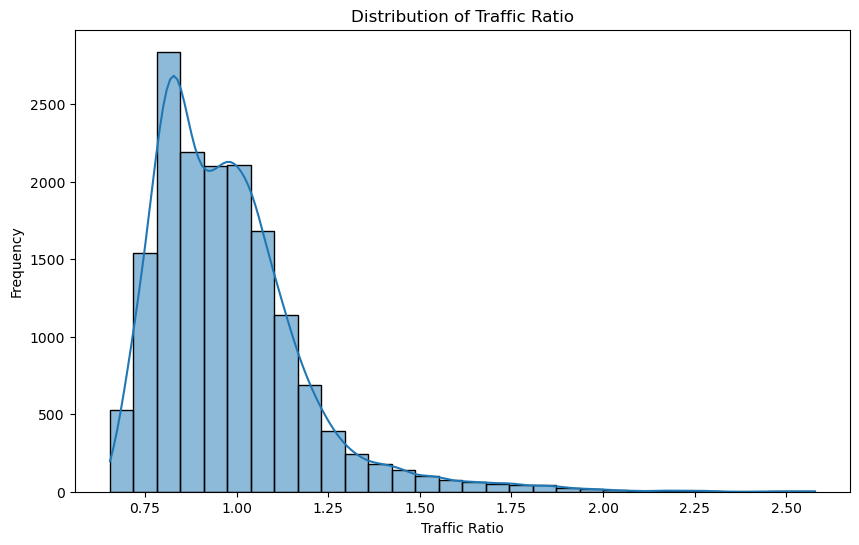

In [5]:
# Traffic Congestion Analysis
# Traffic Ratio Distribution
plt.figure(figsize=(10, 6))
sns.histplot(df['traffic_ratio'], bins=30, kde=True)
plt.title('Distribution of Traffic Ratio')
plt.xlabel('Traffic Ratio')
plt.ylabel('Frequency')
plt.show()


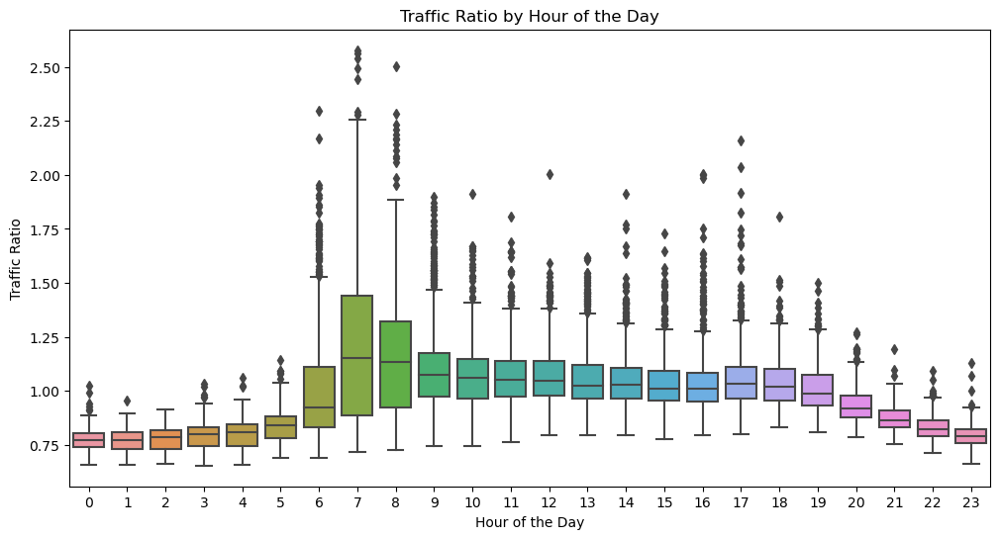

In [6]:
# Traffic Ratio by Hour
plt.figure(figsize=(12, 6))
sns.boxplot(x='hour', y='traffic_ratio', data=df)
plt.title('Traffic Ratio by Hour of the Day')
plt.xlabel('Hour of the Day')
plt.ylabel('Traffic Ratio')
plt.show()


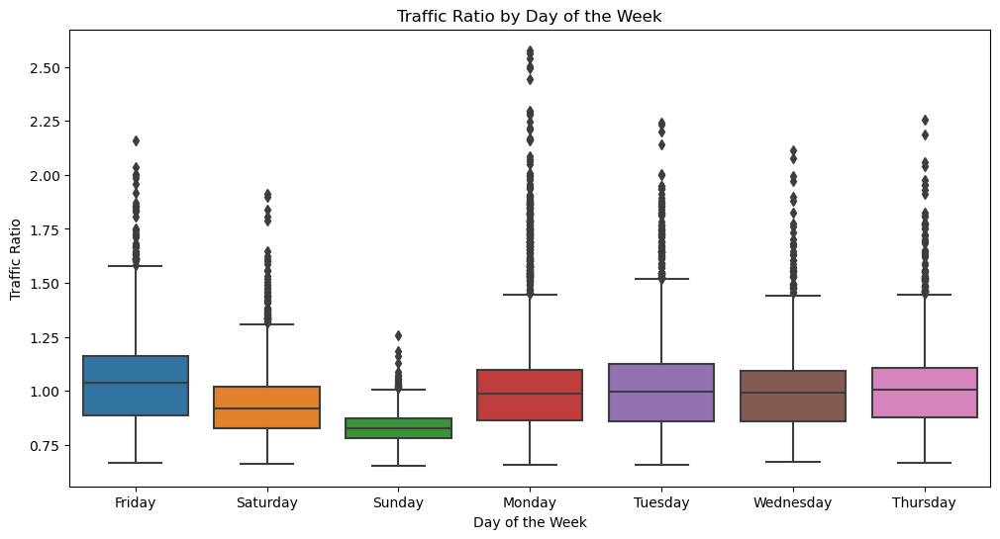

In [7]:
# Traffic Ratio by Day of the Week
plt.figure(figsize=(12, 6))
sns.boxplot(x='day_of_week', y='traffic_ratio', data=df)
plt.title('Traffic Ratio by Day of the Week')
plt.xlabel('Day of the Week')
plt.ylabel('Traffic Ratio')
plt.show()


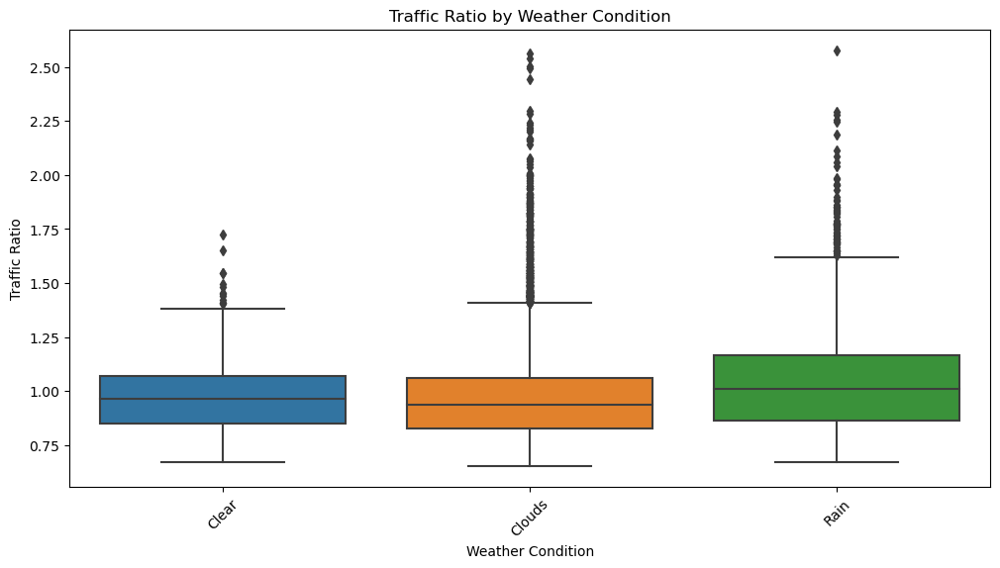

In [8]:

# Traffic Ratio by Weather Condition
plt.figure(figsize=(12, 6))
sns.boxplot(x='weather_condition', y='traffic_ratio', data=df)
plt.title('Traffic Ratio by Weather Condition')
plt.xlabel('Weather Condition')
plt.ylabel('Traffic Ratio')
plt.xticks(rotation=45)
plt.show()


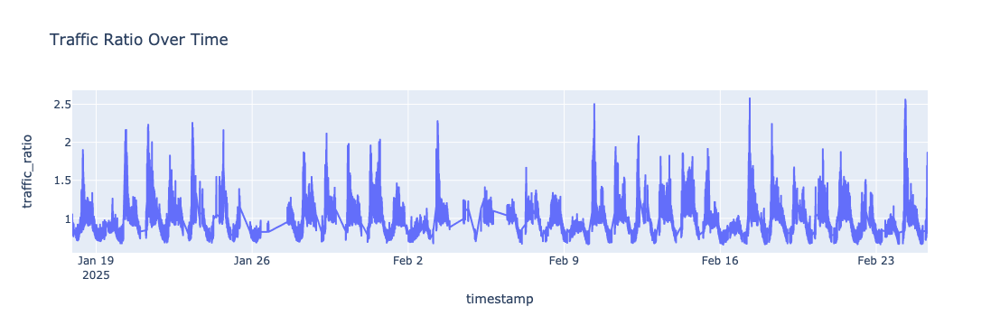

In [9]:
# Dynamic Visualizations with Plotly
# Traffic Ratio Over Time
fig = px.line(df, x='timestamp', y='traffic_ratio', title='Traffic Ratio Over Time')
fig.show()



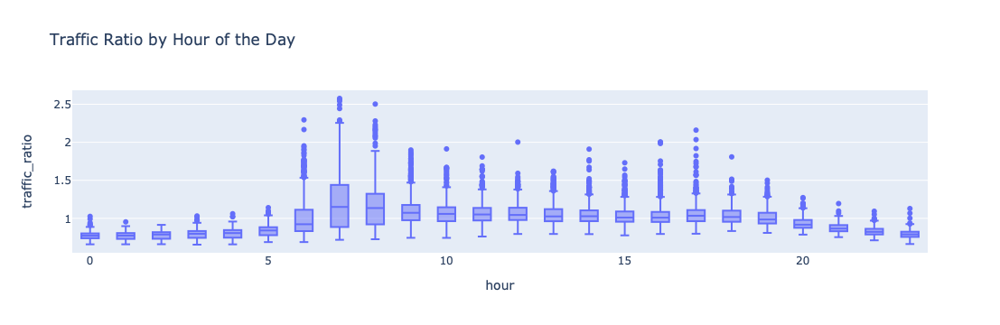

In [10]:
# Traffic Ratio by Hour (Interactive)
fig = px.box(df, x='hour', y='traffic_ratio', title='Traffic Ratio by Hour of the Day')
fig.show()



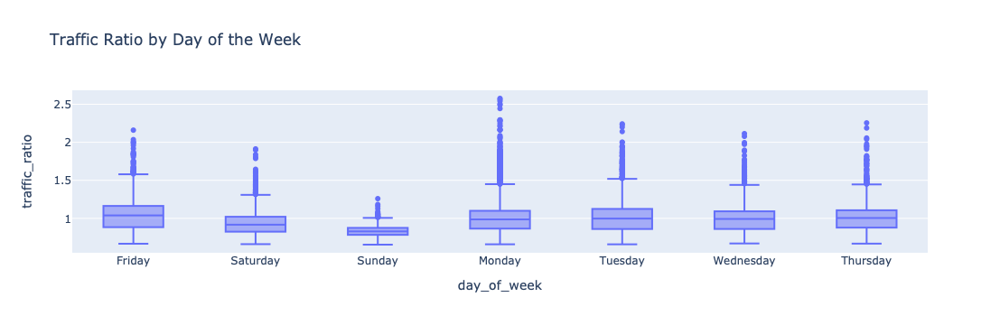

In [11]:
# Traffic Ratio by Day of the Week (Interactive)
fig = px.box(df, x='day_of_week', y='traffic_ratio', title='Traffic Ratio by Day of the Week')
fig.show()



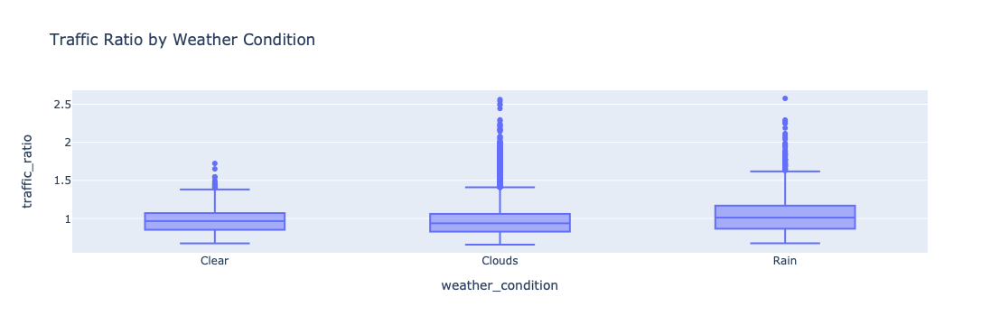

In [12]:
# Traffic Ratio by Weather Condition (Interactive)
fig = px.box(df, x='weather_condition', y='traffic_ratio', title='Traffic Ratio by Weather Condition')
fig.show()



In [14]:
# Drop non-numeric columns (if any)
df_numeric = df.select_dtypes(include=[np.number])

# Handle missing values (fill with mean of each column)
#df_numeric = df_numeric.fillna(df_numeric.mean())

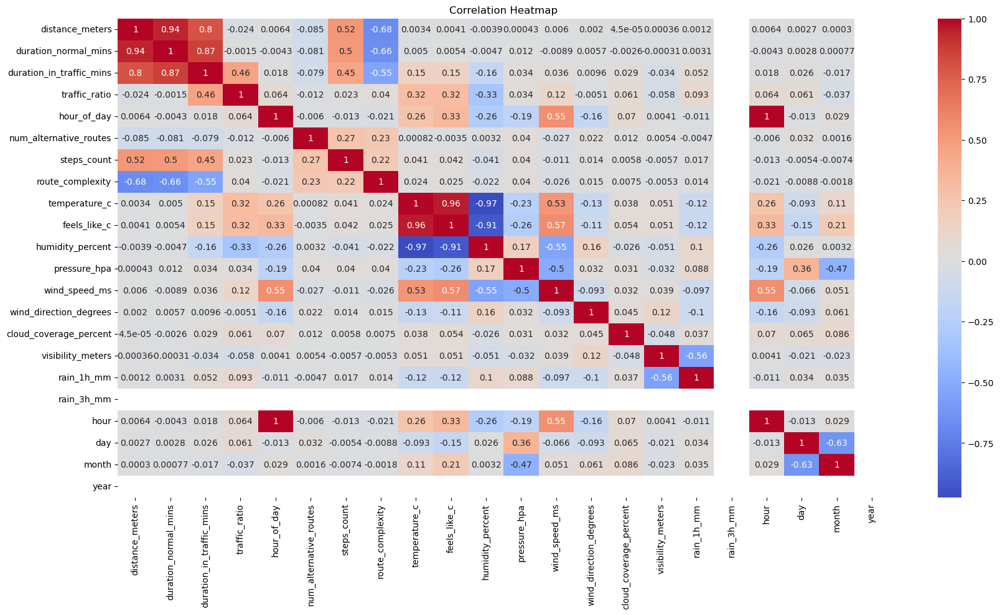

In [16]:
# Correlation Heatmap
corr = df_numeric.corr()
plt.figure(figsize=(20, 10))
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Heatmap')
plt.show()

/Users/user/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning:

The figure layout has changed to tight



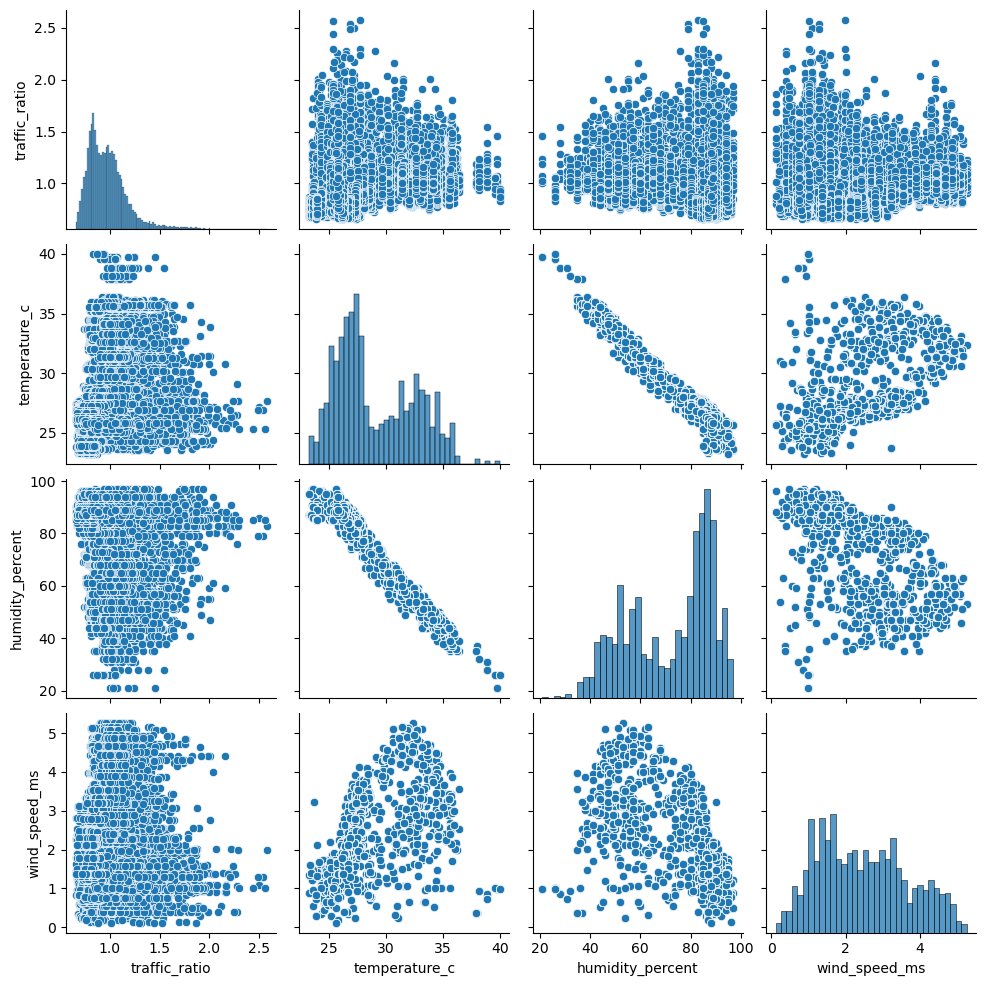

In [17]:
# Pairplot for Selected Features
sns.pairplot(df[['traffic_ratio', 'temperature_c', 'humidity_percent', 'wind_speed_ms']])
plt.show()


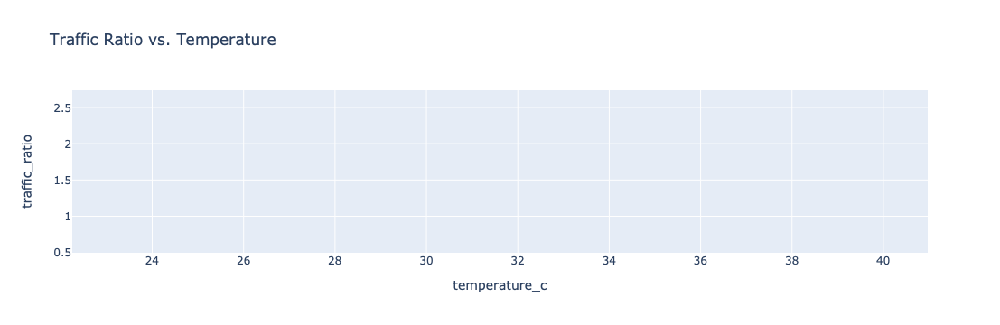

In [18]:
# Traffic Ratio vs. Temperature
fig = px.scatter(df, x='temperature_c', y='traffic_ratio', trendline='ols', 
                 title='Traffic Ratio vs. Temperature')
fig.show()


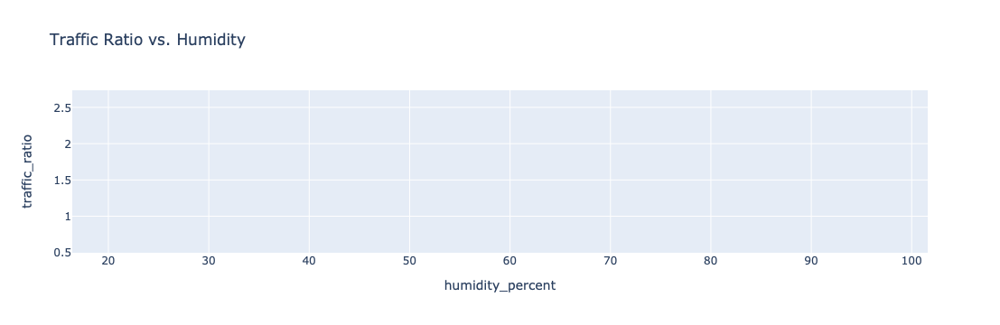

In [19]:
# Traffic Ratio vs. Humidity
fig = px.scatter(df, x='humidity_percent', y='traffic_ratio', trendline='ols', 
                 title='Traffic Ratio vs. Humidity')
fig.show()


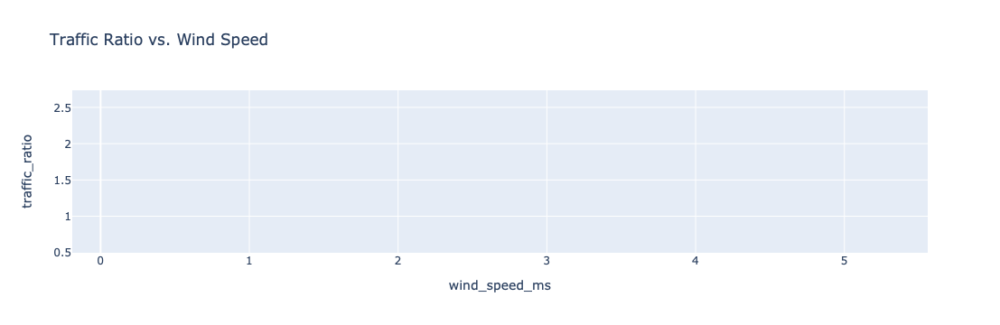

In [20]:
# Traffic Ratio vs. Wind Speed
fig = px.scatter(df, x='wind_speed_ms', y='traffic_ratio', trendline='ols', 
                 title='Traffic Ratio vs. Wind Speed')
fig.show()



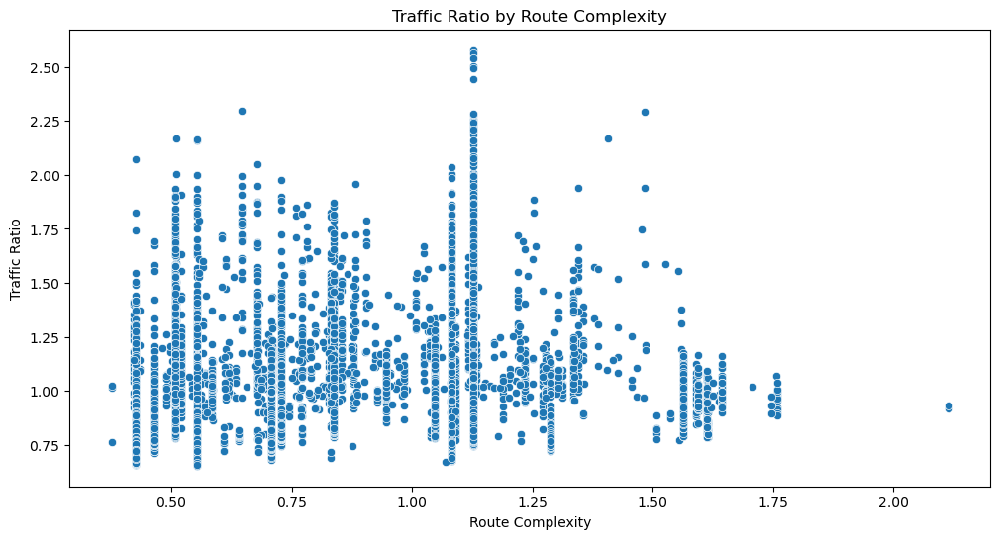

In [21]:
# Traffic Congestion by Route Complexity
plt.figure(figsize=(12, 6))
sns.scatterplot(x='route_complexity', y='traffic_ratio', data=df)
plt.title('Traffic Ratio by Route Complexity')
plt.xlabel('Route Complexity')
plt.ylabel('Traffic Ratio')
plt.show()


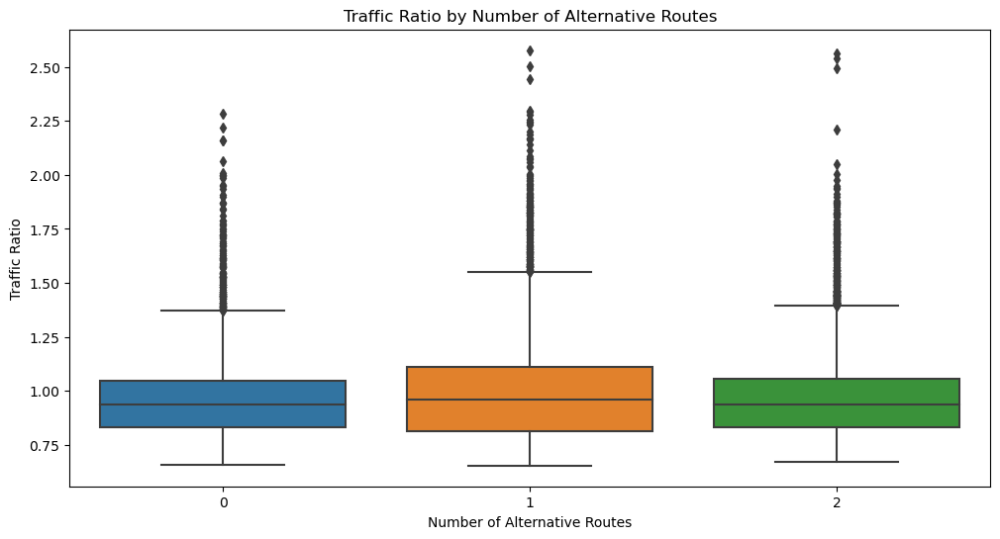

In [22]:
# Traffic Congestion by Number of Alternative Routes
plt.figure(figsize=(12, 6))
sns.boxplot(x='num_alternative_routes', y='traffic_ratio', data=df)
plt.title('Traffic Ratio by Number of Alternative Routes')
plt.xlabel('Number of Alternative Routes')
plt.ylabel('Traffic Ratio')
plt.show()


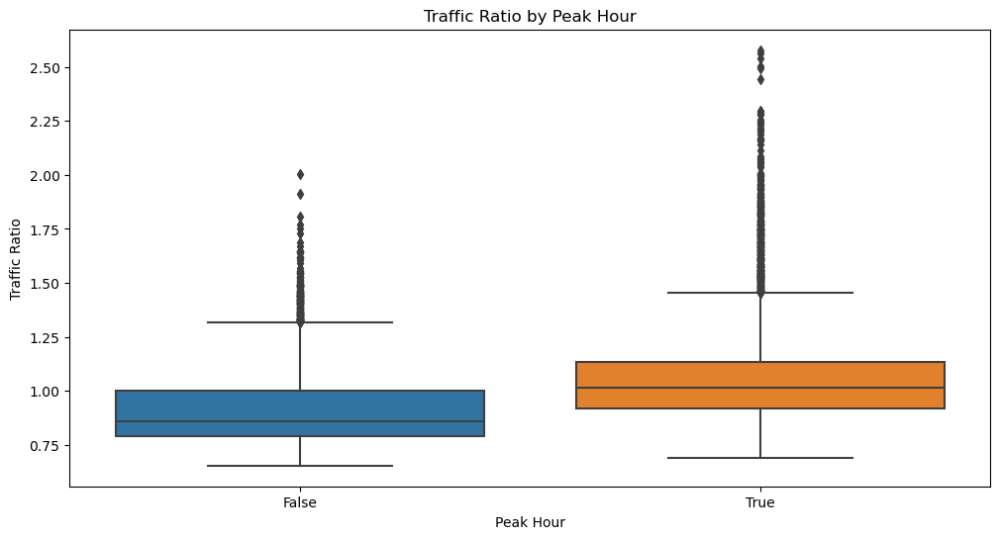

In [23]:
# Traffic Congestion by Peak Hour
plt.figure(figsize=(12, 6))
sns.boxplot(x='peak_hour', y='traffic_ratio', data=df)
plt.title('Traffic Ratio by Peak Hour')
plt.xlabel('Peak Hour')
plt.ylabel('Traffic Ratio')
plt.show()



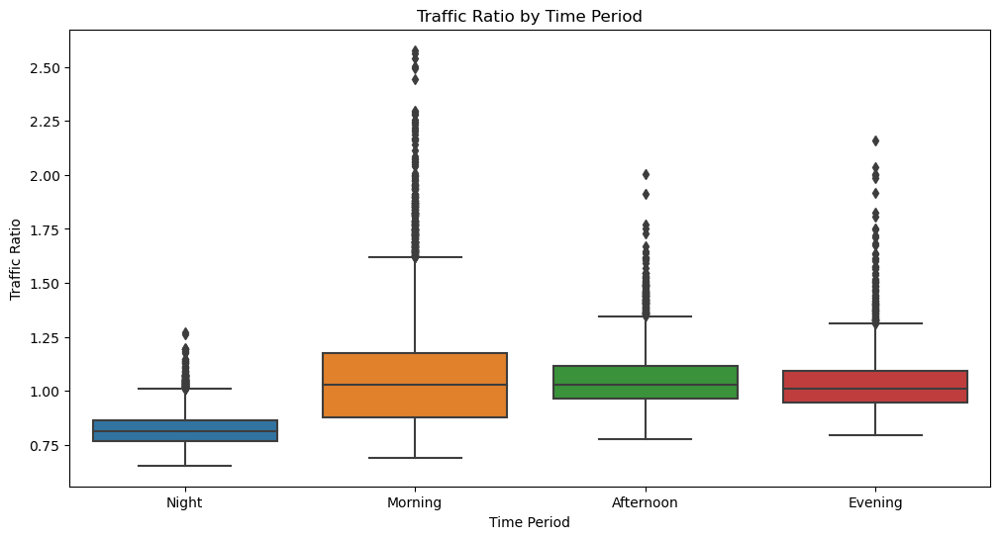

In [24]:
# Traffic Congestion by Time Period
plt.figure(figsize=(12, 6))
sns.boxplot(x='time_period', y='traffic_ratio', data=df)
plt.title('Traffic Ratio by Time Period')
plt.xlabel('Time Period')
plt.ylabel('Traffic Ratio')
plt.show()

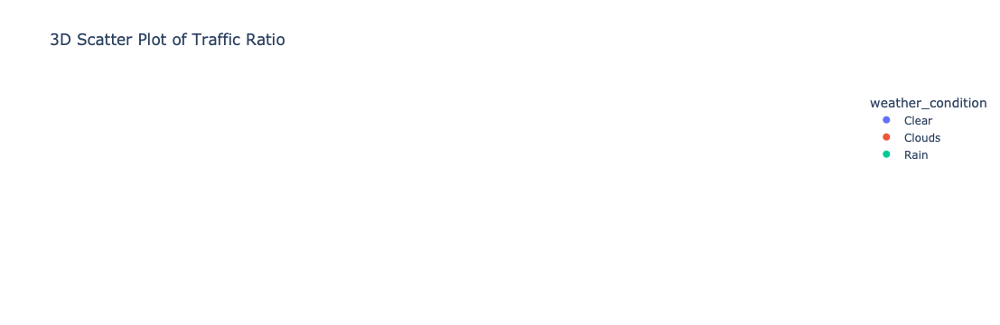

In [25]:
# Interactive 3D Scatter Plot
fig = px.scatter_3d(df, x='temperature_c', y='humidity_percent', z='traffic_ratio',
                    color='weather_condition', title='3D Scatter Plot of Traffic Ratio')
fig.show()



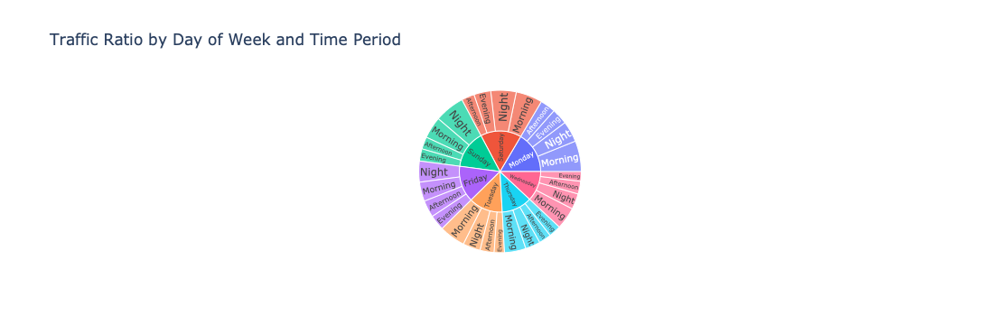

In [26]:
# Interactive Sunburst Chart
fig = px.sunburst(df, path=['day_of_week', 'time_period'], values='traffic_ratio',
                  title='Traffic Ratio by Day of Week and Time Period')
fig.show()



In [29]:
# Interactive Parallel Categories Diagram
#fig = px.parallel_categories(df, dimensions=['day_of_week', 'time_period', 'weather_condition'],
#                             color='traffic_ratio', title='Parallel Categories Diagram')
#fig.show()

In [31]:
# Interactive Map Visualization (if latitude and longitude are available)
#fig = px.scatter_mapbox(df, lat='latitude', lon='longitude', color='traffic_ratio',
#                         size='traffic_ratio', hover_data=['origin', 'destination'],
#                         title='Traffic Ratio Map')
# fig.update_layout(mapbox_style="open-street-map")
# fig.show()



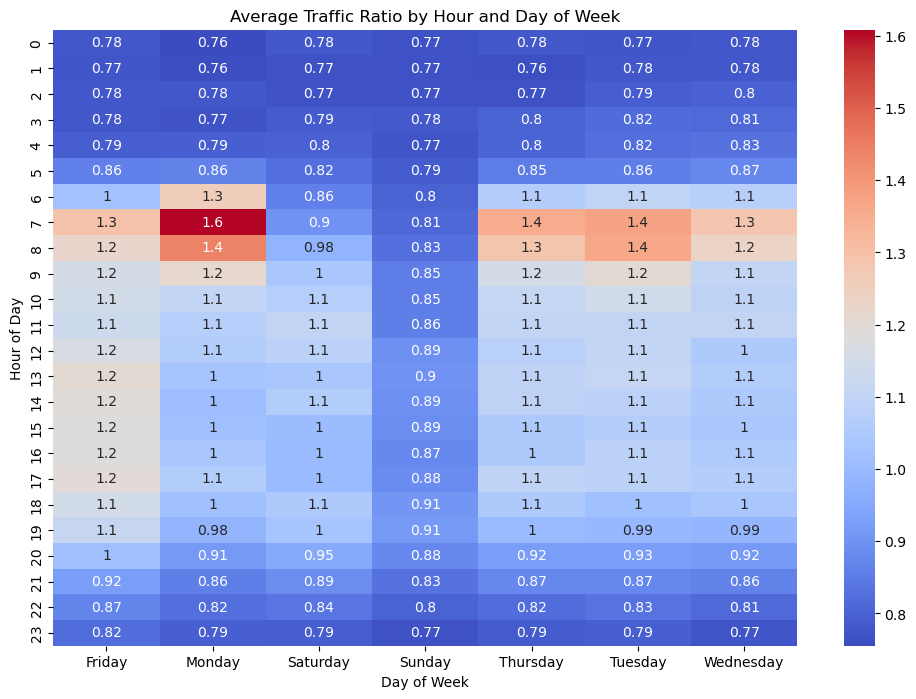

In [32]:
# Additional Insights
# Average Traffic Ratio by Hour and Day of Week
heatmap_data = df.groupby(['hour', 'day_of_week'])['traffic_ratio'].mean().unstack()
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm')
plt.title('Average Traffic Ratio by Hour and Day of Week')
plt.xlabel('Day of Week')
plt.ylabel('Hour of Day')
plt.show()



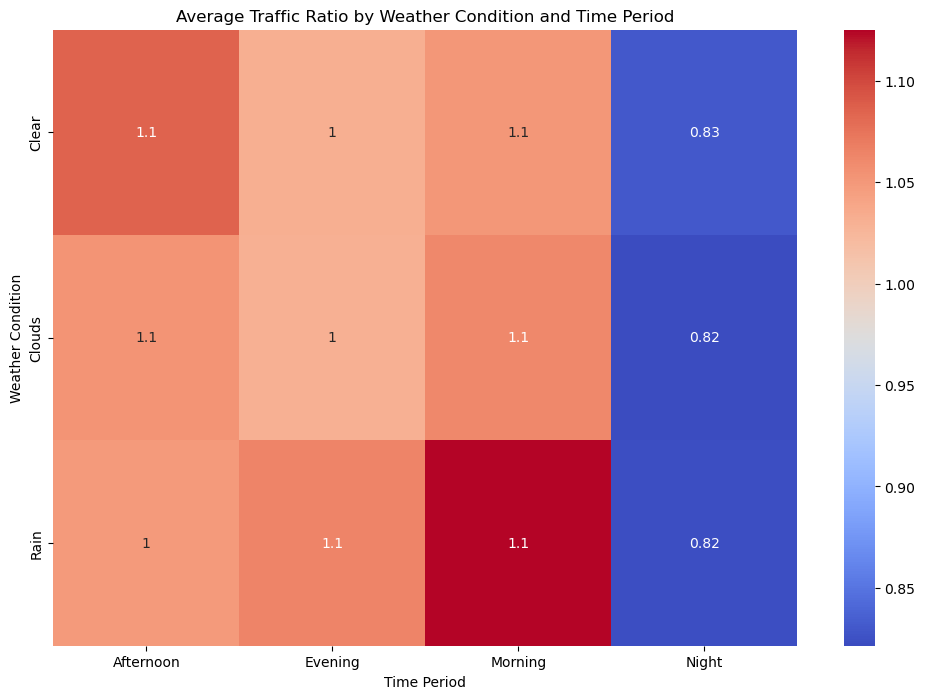

Exploratory Data Analysis Completed.


In [33]:
# Average Traffic Ratio by Weather Condition and Time Period
heatmap_data = df.groupby(['weather_condition', 'time_period'])['traffic_ratio'].mean().unstack()
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm')
plt.title('Average Traffic Ratio by Weather Condition and Time Period')
plt.xlabel('Time Period')
plt.ylabel('Weather Condition')
plt.show()

# Conclusion
print("Exploratory Data Analysis Completed.")

/var/folders/kz/6v17qc1x2218dmh6_lvyvn9c0000gn/T/ipykernel_58081/1334208768.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




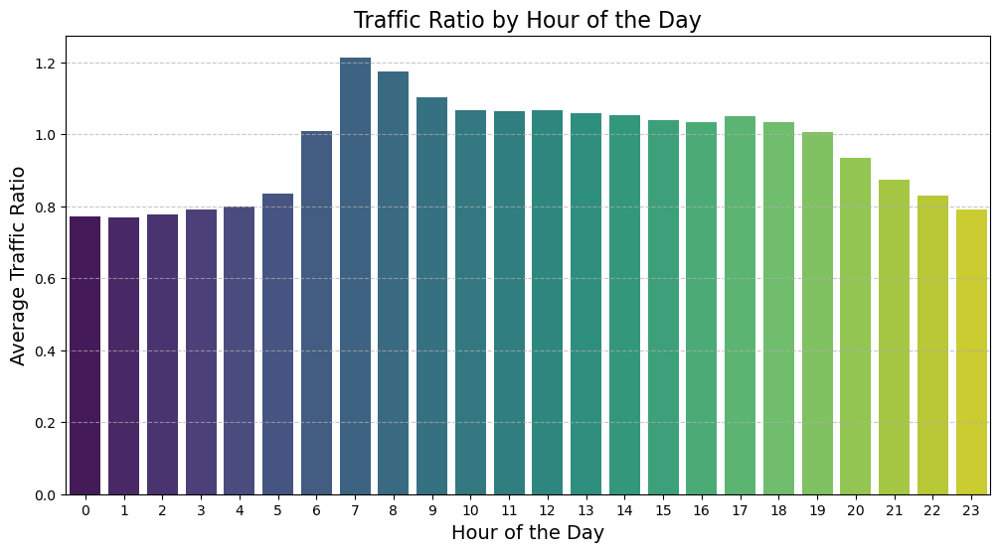

In [34]:
# Bar Chart 1: Traffic Ratio by Hour of the Day
plt.figure(figsize=(12, 6))
sns.barplot(x='hour', y='traffic_ratio', data=df, ci=None, palette='viridis')
plt.title('Traffic Ratio by Hour of the Day', fontsize=16)
plt.xlabel('Hour of the Day', fontsize=14)
plt.ylabel('Average Traffic Ratio', fontsize=14)
plt.xticks(rotation=0)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

/var/folders/kz/6v17qc1x2218dmh6_lvyvn9c0000gn/T/ipykernel_58081/3816278980.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




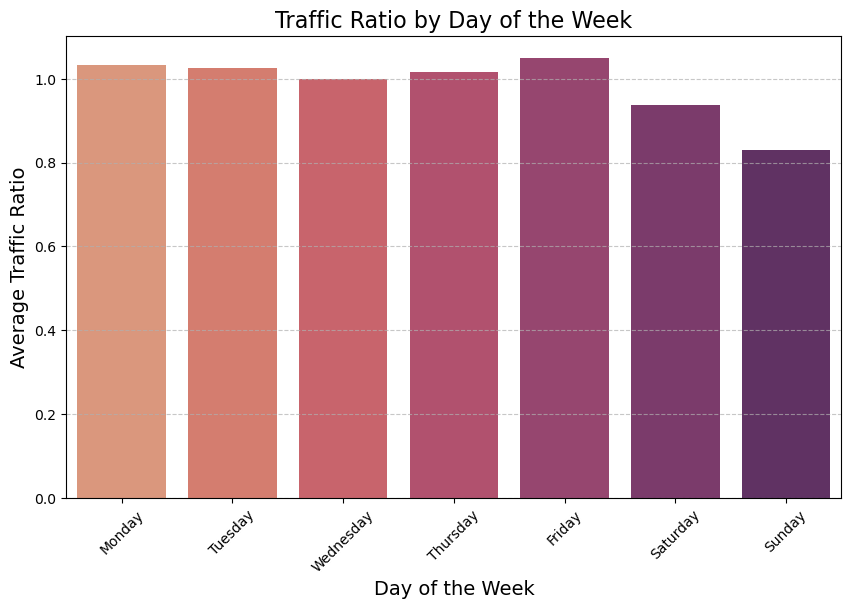

In [38]:
# Bar Chart 2: Traffic Ratio by Day of the Week
plt.figure(figsize=(10, 6))
sns.barplot(x='day_of_week', y='traffic_ratio', data=df, ci=None, palette='flare', 
            order=['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday'])
plt.title('Traffic Ratio by Day of the Week', fontsize=16)
plt.xlabel('Day of the Week', fontsize=14)
plt.ylabel('Average Traffic Ratio', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

/var/folders/kz/6v17qc1x2218dmh6_lvyvn9c0000gn/T/ipykernel_58081/1778102707.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




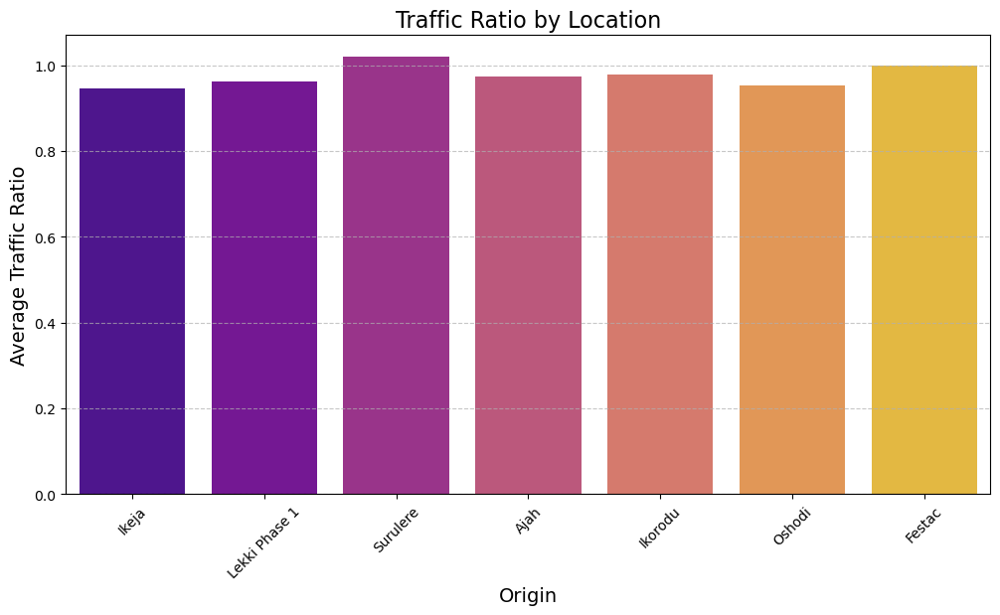

In [44]:
# Bar Chart 4: Traffic Ratio by Origin
plt.figure(figsize=(12, 6))
sns.barplot(x='origin', y='traffic_ratio', data=df, ci=None, palette='plasma')
plt.title('Traffic Ratio by Location', fontsize=16)
plt.xlabel('Origin', fontsize=14)
plt.ylabel('Average Traffic Ratio', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

/var/folders/kz/6v17qc1x2218dmh6_lvyvn9c0000gn/T/ipykernel_58081/1701083082.py:3: FutureWarning:



The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.




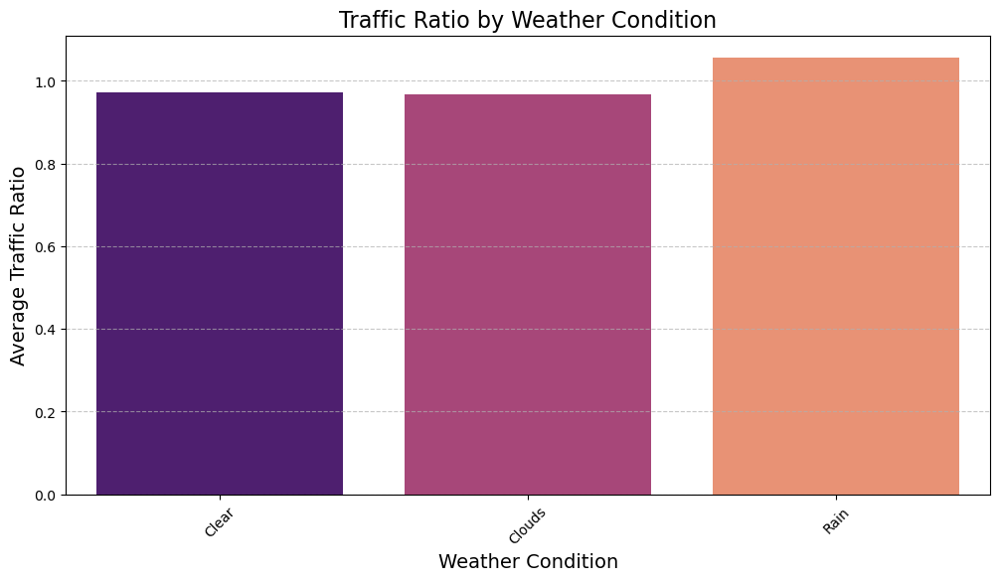

In [40]:
# Bar Chart 3: Traffic Ratio by Weather Condition
plt.figure(figsize=(12, 6))
sns.barplot(x='weather_condition', y='traffic_ratio', data=df, ci=None, palette='magma')
plt.title('Traffic Ratio by Weather Condition', fontsize=16)
plt.xlabel('Weather Condition', fontsize=14)
plt.ylabel('Average Traffic Ratio', fontsize=14)
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

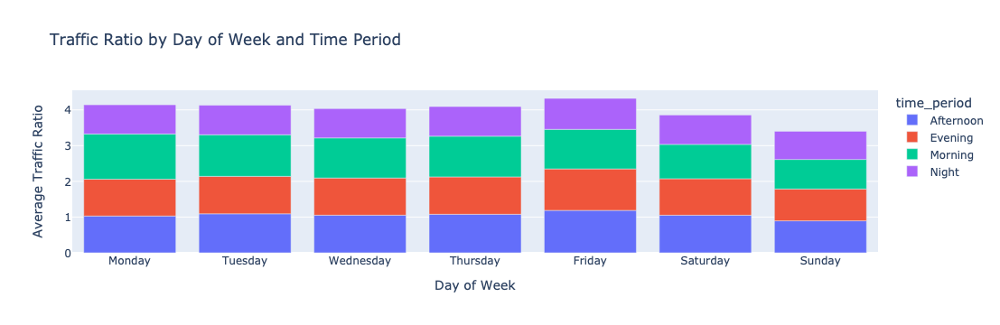

In [42]:
import plotly.express as px

# Aggregate data by day_of_week and time_period
grouped_data = df.groupby(['day_of_week', 'time_period'], as_index=False)['traffic_ratio'].mean()

# Create a stacked bar chart
fig = px.bar(grouped_data, x='day_of_week', y='traffic_ratio', color='time_period',
             title='Traffic Ratio by Day of Week and Time Period',
             labels={'traffic_ratio': 'Average Traffic Ratio', 'day_of_week': 'Day of Week'},
             category_orders={'day_of_week': ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']})
fig.show()

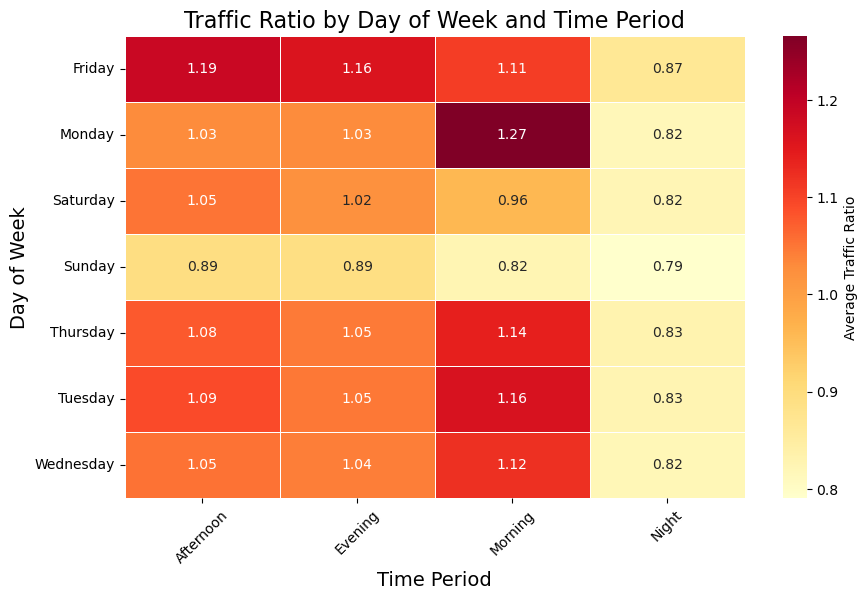

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

# Pivot the data for the heatmap
heatmap_data = df.groupby(['day_of_week', 'time_period'])['traffic_ratio'].mean().unstack()

# Create the heatmap
plt.figure(figsize=(10, 6))
sns.heatmap(heatmap_data, annot=True, cmap='YlOrRd', fmt=".2f",
            linewidths=0.5, cbar_kws={'label': 'Average Traffic Ratio'})
plt.title('Traffic Ratio by Day of Week and Time Period', fontsize=16)
plt.xlabel('Time Period', fontsize=14)
plt.ylabel('Day of Week', fontsize=14)
plt.xticks(rotation=45)
plt.yticks(rotation=0)
plt.show()